In [1]:
%load_ext autoreload
%autoreload 2

## gather data

In [2]:
import os
import torch
import pandas as pd
import numpy as np
from scipy.stats import spearmanr, pearsonr
import pickle

In [3]:
def get_circuit_accuracy(acts,target_acts,metric = 'pearson'):
    target = target_acts.flatten().numpy()
    output = acts.flatten().numpy()
    if metric == 'spearman':
        out = spearmanr(output,target).correlation
        if out is np.nan:
            out = 0.
        return out
    elif metric == 'pearson':
        out = pearsonr(output,target)[0]
        if out is np.nan:
            out = 0.
        return out
    elif metric == 'avg_diff':
        return np.mean(np.abs(output - target))
    elif metric == 'normed_diff':
        norm_factor = np.std(target)
        return np.mean(np.abs(output - target))/norm_factor
        
    else:
        print('unknown metric %s, options ["spearman","pearson","avg_diff","normed_diff"]'%metric)
    

### SKIP THIS

In [4]:
target_activations = {}
extracted_data = []

failure_list = []
columns = ['model','sparsity', 'unit', 'layer', 'cum_sal','masked_spearman','mask_pearson','masked_avg_diff','masked_normed_diff','pruned_spearman','pruned_pearson','pruned_avg_diff','pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path', 'config', 'masked_target_activations', 'feature_name', 'total_collapse', 'total_params', 'masked_k', 'effective_k', 'effective_sparsity']
failures = 0
for m_name in ['alexnet','alexnet_sparse']:
    target_activations[m_name] = torch.load('target_activations/%s/imagenet_2/orig_activations.pt'%m_name)['activations']
    
    for method in ['magnitude']:
        for f in sorted(os.listdir('extracted_circuits/%s/imagenet_2/%s'%(m_name,method))):
            try:
                data = torch.load('extracted_circuits/%s/imagenet_2/%s/%s'%(m_name,method,f))
                data['model'] = m_name
                if not data['total_collapse']:
                    #get accuracy metrics
                    for extract in ['masked','pruned']:
                        for met in ["spearman","pearson","avg_diff","normed_diff"]:
                            if extract == 'masked':
                                model_out = data['masked_target_activations'][data['feature_name']]
                            else:
                                model_out = data['pruned_target_activations'][data['layer']+':0']

                            target = target_activations[m_name][data['feature_name']]
                            data[extract+'_'+met] = get_circuit_accuracy(model_out,target, metric = met)
                    del data['pruned_model']
                    del data['masked_target_activations']
                    del data['pruned_target_activations']
                else:
                    for extract in ['masked','pruned']:
                        for met in ["spearman","pearson","avg_diff","normed_diff"]:
                            data[extract+'_'+met] = np.nan
                extracted_data.append(data)
                
                
                
            except:
                failures+=1
                print(m_name+'   '+method+'  '+f)
                failure_list.append([m_name,method,f])
                    
print('failures :%s'%str(failures))
    
    
#make data frame

columns = ['model','sparsity', 'unit', 'layer', 'cum_sal','masked_spearman','masked_pearson',
           'masked_avg_diff','masked_normed_diff','pruned_spearman','pruned_pearson','pruned_avg_diff',
           'pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path', 'config', 
        'feature_name', 'total_collapse', 'total_params', 'masked_k', 'effective_k', 'effective_sparsity']

big_list = []


for d in extracted_data:
    l = []
    for c in columns:
        try:
            l.append(d[c])
        except:
            if c == 'cum_sal':
                l.append('nan')
        
    big_list.append(l)
            
df = pd.DataFrame(big_list,columns=columns)

#cleanup

df.fillna(0, inplace=True)  
df = df.replace([np.inf, -np.inf], 0) 

#save
import pickle

#pickle.dump(df,open('./extracted_circuits/FORCE_circuit_df.pkl','wb'))


    
    


failures :0


In [10]:
df_mag = df

In [ ]:

#import pickle

#pickle.dump(failure_list,open('extract_model_failures.pkl','wb'))

In [ ]:
# #make data frame

# columns = ['model','sparsity', 'unit', 'layer', 'cum_sal','masked_spearman','masked_pearson',
#            'masked_avg_diff','masked_normed_diff','pruned_spearman','pruned_pearson','pruned_avg_diff',
#            'pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path', 'config', 
#         'feature_name', 'total_collapse', 'total_params', 'masked_k', 'effective_k', 'effective_sparsity']

# big_list = []


# for d in extracted_data:
#     l = []
#     for c in columns:
#         l.append(d[c])
        
#     big_list.append(l)
            
# df = pd.DataFrame(big_list,columns=columns)

# #cleanup

# df.fillna(0, inplace=True)  
# df = df.replace([np.inf, -np.inf], 0) 


### Start here

In [60]:
df = pickle.load(open('./extracted_circuits/circuit_with_force_and_mag_df.pkl','rb'))

In [15]:
#full_df = pd.concat([df,df_mag])

In [19]:
#import pickle

#pickle.dump(full_df,open('./extracted_circuits/circuit_with_force_and_mag_df.pkl','wb'))


In [21]:
df.columns

Index(['model', 'sparsity', 'unit', 'layer', 'cum_sal', 'masked_spearman',
       'masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff',
       'pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path',
       'config', 'feature_name', 'total_collapse', 'total_params', 'masked_k',
       'effective_k', 'effective_sparsity'],
      dtype='object')

In [3]:
df.loc[(df['model']=='alexnet_sparse') & (df['layer']=='features_3') & (df['unit']==87)]

,model,sparsity,unit,layer,cum_sal,masked_spearman,masked_pearson,masked_avg_diff,masked_normed_diff,pruned_spearman,...,structure,batch_size,data_path,config,feature_name,total_collapse,total_params,masked_k,effective_k,effective_sparsity
34115,alexnet_sparse,0.001,87,features_3,tensor(0.0460),0.000000,0.000000,0.000000,0.000000,0.000000,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,True,256,1,0,0.000000
34116,alexnet_sparse,0.005,87,features_3,tensor(0.0852),0.000000,0.000000,0.000000,0.000000,0.000000,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,True,256,2,0,0.000000
34117,alexnet_sparse,0.010,87,features_3,tensor(0.1199),0.000000,0.000000,0.000000,0.000000,0.000000,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,True,256,3,0,0.000000
34118,alexnet_sparse,0.050,87,features_3,tensor(0.3999),0.000000,0.000000,0.000000,0.000000,0.000000,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,True,256,13,0,0.000000
34119,alexnet_sparse,0.100,87,features_3,tensor(0.6545),0.000000,0.000000,0.000000,0.000000,0.000000,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,True,256,26,0,0.000000
34120,alexnet_sparse,0.200,87,features_3,tensor(0.8414),-0.056576,-0.043451,3.707287,0.743764,-0.036857,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,False,256,52,4,0.015625
34121,alexnet_sparse,0.300,87,features_3,tensor(0.8996),0.677377,0.738850,2.612634,0.524152,0.676487,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,False,256,77,42,0.164062
34122,alexnet_sparse,0.400,87,features_3,tensor(0.9376),0.852899,0.888834,1.878234,0.376816,0.851750,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,False,256,103,73,0.285156
34123,alexnet_sparse,0.500,87,features_3,tensor(0.9623),0.912029,0.938454,1.448974,0.290696,0.911283,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,False,256,128,108,0.421875
34124,alexnet_sparse,0.600,87,features_3,tensor(0.9795),0.962667,0.973638,0.907459,0.182056,0.962049,...,edges,200,/mnt/data/chris/dropbox/Research-Hamblin/Proje...,configs/alexnet_sparse_config.py,features_3:87,False,256,154,140,0.546875


## load data from file

In [51]:
import pickle

df = pickle.load(open('./extracted_circuits/circuit_with20force_df.pkl','rb'))

In [4]:
df.loc[df['method'] == 'FORCE']

,model,sparsity,unit,layer,cum_sal,masked_spearman,masked_pearson,masked_avg_diff,masked_normed_diff,pruned_spearman,...,structure,batch_size,data_path,config,feature_name,total_collapse,total_params,masked_k,effective_k,effective_sparsity
0,alexnet,0.001,0,features_10,nan,0.081936,0.166641,6.187822,1.671333,0.081980,...,kernels,200,image_data/imagenet_2/,configs/alexnet_config.py,features_10:0,False,184768,185,81,0.000438
1,alexnet,0.005,0,features_10,nan,0.001792,-0.012649,3.489255,0.942449,0.001135,...,kernels,200,image_data/imagenet_2/,configs/alexnet_config.py,features_10:0,False,184768,924,454,0.002457
2,alexnet,0.010,0,features_10,nan,-0.017628,-0.008566,6.531553,1.764174,-0.015901,...,kernels,200,image_data/imagenet_2/,configs/alexnet_config.py,features_10:0,False,184768,1848,1266,0.006852
3,alexnet,0.050,0,features_10,nan,0.103432,0.099865,3.342163,0.902719,0.087718,...,kernels,200,image_data/imagenet_2/,configs/alexnet_config.py,features_10:0,False,184768,9239,6424,0.034768
4,alexnet,0.100,0,features_10,nan,0.237962,0.241956,4.979953,1.345087,0.237967,...,kernels,200,image_data/imagenet_2/,configs/alexnet_config.py,features_10:0,False,184768,18477,14624,0.079148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2075,alexnet_sparse,0.500,9,features_8,nan,0.999979,0.999983,0.010414,0.004711,0.999979,...,kernels,200,image_data/imagenet_2/,configs/alexnet_sparse_config.py,features_8:9,False,86592,43296,43286,0.499885
2076,alexnet_sparse,0.600,9,features_8,nan,0.999999,0.999999,0.002353,0.001065,0.999999,...,kernels,200,image_data/imagenet_2/,configs/alexnet_sparse_config.py,features_8:9,False,86592,51956,51954,0.599986
2077,alexnet_sparse,0.700,9,features_8,nan,1.000000,1.000000,0.000799,0.000361,1.000000,...,kernels,200,image_data/imagenet_2/,configs/alexnet_sparse_config.py,features_8:9,False,86592,60615,60615,0.700007
2078,alexnet_sparse,0.800,9,features_8,nan,1.000000,1.000000,0.000250,0.000113,1.000000,...,kernels,200,image_data/imagenet_2/,configs/alexnet_sparse_config.py,features_8:9,False,86592,69274,69274,0.800005


#### effective sparsity versus sparsity

In [50]:
import plotly.express as px


df = df.sort_values(by="sparsity")
df = df.sort_values(by=['feature_name','sparsity'])
fig = px.scatter(df.loc[(df['method'] == 'actxgrad')], x="sparsity", y="effective_sparsity", color="layer")

fig.update_xaxes(autorange="reversed")

fig.show()




#### all data

In [6]:
import plotly.graph_objects as go


fig = go.Figure()

method = 'actxgrad'

trace_col = 'feature_name'
x_col = 'sparsity'
y_col = 'masked_pearson'
color_col = 'layer'

layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']=='alexnet_sparse') & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df_plot[trace_col].unique()):
    x = df_plot.loc[df_plot[trace_col] == trace][x_col]
    y = df_plot.loc[df_plot[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    

fig.update_xaxes(autorange="reversed",title="Sparsity",type='log') 
fig.update_yaxes(title="Model vs Circuit Activations (Pearson)")

fig.update_layout({
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })

fig.show()

In [69]:
# add absolute value of pearson column

df['masked_pearson_abs'] = df['masked_pearson'].apply(abs)
df['pruned_pearson_abs'] = df['pruned_pearson'].apply(abs)


In [148]:
import plotly.express as px
import plotly.graph_objs as go

fig = go.Figure()




method = 'actxgrad'
model='alexnet_sparse'
trace_col = 'sparsity'
x_col = 'sparsity'
y_col = 'masked_pearson_abs'
color_col = 'layer'



layer_colors = {'features_3':px.colors.qualitative.T10[4],
                'features_6':px.colors.qualitative.T10[3],
                'features_8':px.colors.qualitative.T10[1],
                'features_10':px.colors.qualitative.T10[0],
               }



df_plot = df.loc[(df['method']==method) & (df['layer']!='features_3') & (df['sparsity']<.6)].sort_values(by=[trace_col,x_col])
df_plot = df_plot.replace({'alexnet_sparse': 'sparse alexnet'})

fig = px.box(df_plot, x="sparsity", y=y_col, color="model")



#sparsities = [.9,.8,.7,.6,.5,.4,.3,.2,.1,.05,.001]

# sparsities = [.5,.4,.3,.2,.1,.05,.001]

# df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['layer']!='features_3') & (df['sparsity']<.6)].sort_values(by=[trace_col,x_col])
# df_plot = df_plot.astype({'sparsity': 'category'})


# #fig = px.box(df_plot, x=x_col, y=y_col, color='model')


# #for trace in list(df_plot[trace_col].unique()):
# for trace in df_plot['sparsity'].unique():
#     fig.add_trace(go.Box(x=df_plot[trace_col][df_plot[trace_col] == trace],
#                             y=df_plot[y_col][df_plot[trace_col] == trace],
#                             name=trace,
#                             line_color=px.colors.qualitative.T10[0],
#                             #box_visible=True,
#                             #meanline_visible=True
#                         ))

# df_plot = df.loc[(df['method']==method) & (df['model']!=model) & (df['layer']!='features_3') & (df['sparsity']<.6)].sort_values(by=[trace_col,x_col])
# df_plot = df_plot.astype({'sparsity': 'category'})
    
    
# for trace in df_plot['sparsity'].unique():
#     fig.add_trace(go.Box(x=df_plot[trace_col][df_plot[trace_col] == trace],
#                             y=df_plot[y_col][df_plot[trace_col] == trace],
#                             name=trace,
#                             line_color=px.colors.qualitative.T10[2],
#                             #box_visible=True,
#                             #meanline_visible=True
#                            ))
    
    
fig.update_xaxes(autorange="reversed",title="Sparsity") 
fig.update_yaxes(title="|Pearson R|")
#fig.update_yaxes(range=[-.7, 1.02])

fig.update_layout({ 'showlegend':True,
                    'width':1200,
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })
   
fig.update_layout(
    xaxis = dict(
        tickmode = 'array'
    )
)
fig.update_layout(xaxis_type='category')
                
                
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.4,
    xanchor="left",
    x=0.05
))

fig.show()


In [151]:
from circuit_pruner.visualizer.layouts import big_fig_layout

#fig.update_layout(big_fig_layout)
fig.update_layout({ 'width':3000,
                    'height':1650,
                    'font':{'size':64}})

fig.update_yaxes(
        title_standoff = 60,gridcolor='rgb(210,210,210)')
fig.update_xaxes(
        title_standoff = 60,gridcolor='rgb(210,210,210)')

fig.update_layout(legend=dict(
                             font=dict(size=60)
                    ))

fig.update_layout(legend= {'bgcolor': 'rgba(255,0,0,0)'})
# fig.add_annotation(text="a)",
#                   xref="paper", yref="paper",
#                   x=-.06, y=1.05, showarrow=False,
#                   font={'size':80})

In [152]:
fig.write_html("plots/alexnet_sparse_noconv2_pearson_boxplot_actxgrad_withsparse_big.html")
fig.write_image("plots/alexnet_sparse_noconv2_pearson_boxplot_actxgrad_withsparse_big.svg")
fig.write_image("plots/alexnet_sparse_noconv2_pearson_boxplot_actxgrad_withsparse_big.png")

In [43]:
import plotly.graph_objects as go


fig = go.Figure()

method = 'actxgrad'
model = 'alexnet_sparse'

trace_col = 'feature_name'
x_col = 'sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'


layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df_plot[trace_col].unique()):
    x = df_plot.loc[df_plot[trace_col] == trace][x_col]
    y = df_plot.loc[df_plot[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    
fig.update_xaxes(autorange="reversed")
    
fig.show()

In [44]:
#grouped by layer in legend
import plotly.graph_objects as go


fig = go.Figure()

method = 'actxgrad'
model = 'alexnet_sparse'

trace_col = 'layer'
x_col = 'sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'


layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df_plot[trace_col].unique()):
    x = df_plot.loc[df_plot[trace_col] == trace][x_col]
    y = df_plot.loc[df_plot[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    
fig.update_xaxes(autorange="reversed")
    
fig.show()

In [31]:
#sample sparsity trajectories


import plotly.graph_objects as go


fig = go.Figure()

method = 'actxgrad'
model = 'alexnet_sparse'
trace_col = 'feature_name'
x_col = 'effective_sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'

layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['unit'] > 22) & (df['unit'] < 24) & (df['sparsity'] != .005) & (df['method']==method) &  (df['layer']=='features_8') & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df_plot[trace_col].unique()):
    x = df_plot.loc[df_plot[trace_col] == trace][x_col]
    y = df_plot.loc[df_plot[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    
#fig.update_xaxes(autorange="reversed",type='log')
    
fig.update_xaxes(autorange="reversed",title="Sparsity") 
fig.update_yaxes(title="Model vs Circuit Activations (Pearson)")
#fig.update_yaxes(zeroline=True,zerolinecolor='black')
fig.update_layout({ 'showlegend':False,
                    'width':900,
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })
    
fig.show()

In [32]:
fig.write_html("plots/alexnet_sparse_noconv2_pearson_one_traj.html")
fig.write_image("plots/alexnet_sparse_noconv2_pearson_one_traj.svg")
fig.write_image("plots/alexnet_sparse_noconv2_pearson_one_traj.png")

In [ ]:
import plotly.graph_objects as go


fig = go.Figure()

method = 'snip'
model = 'alexnet_sparse'
trace_col = 'feature_name'
x_col = 'sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'

layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df[trace_col].unique()):
    x = df_plot.loc[df[trace_col] == trace][x_col]
    y = df_plot.loc[df[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    
fig.update_xaxes(autorange="reversed",type='log')
#fig.update_xaxes(autorange="reversed")
    
    
fig.show()

In [ ]:
import plotly.graph_objects as go


fig = go.Figure()

method = 'snip'
model = 'alexnet_sparse'
trace_col = 'feature_name'
x_col = 'effective_sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'

layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df[trace_col].unique()):
    x = df_plot.loc[df[trace_col] == trace][x_col]
    y = df_plot.loc[df[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=trace,
                    line=dict(color=layer_colors[list(df_plot.loc[df_plot[trace_col] == trace]['layer'])[0]])))
    
fig.update_xaxes(autorange="reversed",type='log')
#fig.update_xaxes(autorange="reversed")
    
    
fig.show()

In [ ]:
import plotly.graph_objects as go


fig = go.Figure()

method = 'snip'

trace_col = 'feature_name'
x_col = 'effective_sparsity'
y_col = 'pruned_pearson'
color_col = 'layer'

layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9',
               }



df_plot = df.loc[(df['method']==method) & (df['model']=='alexnet') & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])




for trace in list(df[trace_col].unique()):
    x = df.loc[df[trace_col] == trace][x_col]
    y = df.loc[df[trace_col] == trace][y_col]

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=trace,
                    line=dict(color=layer_colors[list(df.loc[df[trace_col] == trace]['layer'])[0]])))
    
fig.update_xaxes(autorange="reversed")
    
fig.show()

In [ ]:
#average_cost

diff = 



In [ ]:
data = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/snip/alexnet_sparse_features_8:14_0.1.pt')

In [ ]:

data = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/snip/alexnet_sparse_features_10:10_0.3.pt')
data.keys()

In [ ]:
i = 0
for f in os.listdir('extracted_circuits/alexnet_sparse/imagenet_2/actxgrad/'):
    d = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/actxgrad/%s'%f)
    if not d['total_collapse']:
        if d['pruned_target_activations'] == {}:
            print(f)
            i+=1
print(i)

In [ ]:
d = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/actxgrad/alexnet_sparse_features_6:4_0.8.pt')
net = d['pruned_model']

In [ ]:
for f in os.listdir('extracted_circuits/alexnet_sparse/imagenet_2/snip/'):
    d = d = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/snip/%s'%f)
    if not d['total_collapse']:
        net = d['pruned_model']

        for name, layer in reversed(net._modules.items()):
            break

        
        print(layer.out_channels)

In [ ]:
d = torch.load('extracted_circuits/alexnet_sparse/imagenet_2/actxgrad/alexnet_sparse_features_8:1_0.8.pt')

#### Methods comparison

### SKIP THIS

In [30]:
#NOTES: we'll treat anti correlations as equivalent to a 0 correlation for the purposes of methods comparison

avg_methods_list = []
avg_methods_columns = ['model','sparsity','feature_name','layer','unit',
                       'masked_spearman','masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
                       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff','pruned_normed_diff']


measures = ['masked_spearman','masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
            'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff','pruned_normed_diff']


for feature in list(df['feature_name'].unique()):
    for sparsity in list(df['sparsity'].unique()):
        for model in list(df['model'].unique()):
            measures_dict = {}
            for measure in measures:
                measures_dict[measure] = 0

            select = df.loc[(df['feature_name'] == feature) &
                       (df['sparsity'] == sparsity) & 
                       (df['model'] == model)]
            if len(select) > 0:
                for measure in measures:
                    for i, row in select.iterrows():
                        if 'diff' in measure:
                            measures_dict[measure] += np.abs(row[measure])
                        else:
                            measures_dict[measure] += np.max((row[measure],0))
                    measures_dict[measure] /= float(len(select))


                avg_methods_list.append([model,sparsity,feature,feature.split(':')[0],int(feature.split(':')[1]),
                                          measures_dict['masked_spearman'],measures_dict['masked_pearson'], 
                                          measures_dict['masked_avg_diff'],measures_dict['masked_normed_diff'],
                                          measures_dict['pruned_spearman'],measures_dict['pruned_pearson'],
                                          measures_dict['pruned_avg_diff'],measures_dict['pruned_normed_diff']])   


avg_methods_df = pd.DataFrame(avg_methods_list, columns = avg_methods_columns)
                
        

In [32]:
#pickle.dump(avg_methods_df,open('./extracted_circuits/circuit_with20force_avgmethods_df.pkl','wb'))

### Start here

In [34]:
avg_methods_df = pickle.load(open('./extracted_circuits/circuit_with20force_avgmethods_df.pkl','rb'))

In [35]:
avg_methods_df.columns

Index(['model', 'sparsity', 'feature_name', 'layer', 'unit', 'masked_spearman',
       'masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff',
       'pruned_normed_diff'],
      dtype='object')

In [16]:
#WITH FORCE20 only units 0-19


avg_methods_df_20units = avg_methods_df.loc[avg_methods_df['unit'] < 20]
df_20units = df.loc[df['unit'] < 20]

measures = ['masked_spearman','masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
            'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff','pruned_normed_diff']


methods = ['actxgrad','snip','FORCE']


diff_columns = ['model','sparsity','feature_name','layer','unit']

for method in methods:
    for measure in measures:
        diff_columns.append(method+'_'+measure)


diff_list = [] 
for i,avg_row in avg_methods_df_20units.iterrows():
    if avg_row['sparsity'] == .95:
        continue
    diff_row = [avg_row['model'],avg_row['sparsity'],avg_row['feature_name'],avg_row['layer'],avg_row['unit']]
    for method in methods:
        method_row = df_20units.loc[(df_20units['model'] == avg_row['model']) &
                                    (df_20units['sparsity'] == avg_row['sparsity']) &
                                    (df_20units['feature_name'] == avg_row['feature_name']) &
                                    (df_20units['method'] == method) 
                                    ].iloc[0,:]


        for measure in measures:
            if 'diff' in measure:
                diff_row.append(avg_row[measure] - method_row[measure])
            else:
                diff_row.append(method_row[measure] - avg_row[measure])
    
    diff_list.append(diff_row)
        
        
       
diff_methods_df_20units = pd.DataFrame(diff_list, columns = diff_columns)





In [62]:
diff_methods_df_20units

,model,sparsity,feature_name,layer,unit,actxgrad_masked_spearman,actxgrad_masked_pearson,actxgrad_masked_avg_diff,actxgrad_masked_normed_diff,actxgrad_pruned_spearman,...,snip_pruned_avg_diff,snip_pruned_normed_diff,FORCE_masked_spearman,FORCE_masked_pearson,FORCE_masked_avg_diff,FORCE_masked_normed_diff,FORCE_pruned_spearman,FORCE_pruned_pearson,FORCE_pruned_avg_diff,FORCE_pruned_normed_diff
0,alexnet,0.001,features_10:0,features_10,0,-2.731190e-02,-5.554693e-02,2.062607,0.557111,-2.732656e-02,...,2.078276,0.561343,5.462380e-02,1.110939e-01,-4.125215,-1.114222,5.465312e-02,1.095746e-01,-4.156552,-1.122686
1,alexnet_sparse,0.001,features_10:0,features_10,0,6.340069e-02,6.716116e-02,-0.603247,-0.285754,9.998631e-02,...,2.164451,1.025287,-6.643375e-02,-2.219161e-02,-1.737153,-0.822878,-8.381428e-02,-3.696586e-02,-1.743493,-0.825882
2,alexnet,0.005,features_10:0,features_10,0,-4.293806e-03,-4.647687e-02,-0.142893,-0.038595,-1.506820e-02,...,-0.737347,-0.199158,1.194847e-03,-1.264886e-02,0.783728,0.211685,7.569936e-04,-1.445083e-02,0.804718,0.217355
3,alexnet_sparse,0.005,features_10:0,features_10,0,2.413062e-02,-2.523825e-02,0.267123,0.126535,-2.233865e-02,...,0.404535,0.191626,-1.512969e-01,-1.336577e-01,-0.558711,-0.264658,-1.380028e-01,-1.040412e-01,-0.830533,-0.393418
4,alexnet,0.010,features_10:0,features_10,0,9.012962e-02,9.919855e-02,1.258207,0.339842,6.780571e-02,...,0.578978,0.156382,-7.471257e-02,-5.816533e-02,-1.945623,-0.525513,-5.652553e-02,-4.452907e-02,-1.872220,-0.505687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2075,alexnet_sparse,0.700,features_8:9,features_8,9,5.372822e-08,4.277923e-08,0.000228,0.000103,5.372903e-08,...,-0.000034,-0.000016,-5.079151e-08,-4.035741e-08,-0.000194,-0.000088,-5.079176e-08,-4.035711e-08,-0.000194,-0.000088
2076,alexnet,0.800,features_8:9,features_8,9,1.793999e-02,1.565320e-02,0.346857,0.062610,1.793912e-02,...,0.003740,0.000675,-1.837796e-02,-1.640066e-02,-0.350403,-0.063250,-1.838593e-02,-1.640741e-02,-0.350707,-0.063305
2077,alexnet_sparse,0.800,features_8:9,features_8,9,8.024264e-09,6.315870e-09,0.000092,0.000041,8.024147e-09,...,-0.000036,-0.000016,-4.927754e-09,-3.829115e-09,-0.000056,-0.000025,-4.927425e-09,-3.829397e-09,-0.000056,-0.000025
2078,alexnet,0.900,features_8:9,features_8,9,4.537324e-03,3.909866e-03,0.089030,0.016071,4.536978e-03,...,-0.043750,-0.007897,-1.773651e-03,-2.040422e-03,-0.045212,-0.008161,-1.773998e-03,-2.040742e-03,-0.045246,-0.008167


In [118]:
#plot method diff average by sparsity

import plotly.graph_objects as go


fig = go.Figure()

model = 'alexnet'

measure = 'masked_pearson'
color_col = 'method'


method_colors = {'actxgrad':'#c91916',
                'snip':'#72c916',
                'FORCE':'#1681c9'
               }


df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model) & (diff_methods_df_20units['sparsity'] < .8)]
df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model)]
#df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])

sparsities =  list(df_plot['sparsity'].unique())
sparsities.sort()

for method in methods:
    x = sparsities
    y = []
    for sparsity in sparsities:
        df_sel = df_plot.loc[(df_plot['sparsity'] == sparsity)]
        y.append(np.mean(df_sel[method+'_'+measure]))

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=method,
                    #line=dict(color=method_colors[method])
                    line=dict(width=8)
                            )
                 )
    
fig.update_xaxes(autorange="reversed",title = 'sparsity')
fig.update_yaxes(title = 'avg diff in Pearson R')

fig.update_layout({ 'showlegend':True,
                    'width':900,
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })
   
fig.update_layout(
    xaxis = dict(
        tickmode = 'array'
    )
)
                
                
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.95,
    xanchor="left",
    x=0.05
))
    
fig.show()

In [119]:
from circuit_pruner.visualizer.layouts import big_fig_layout

fig.update_layout(big_fig_layout)
#fig.update_layout({ 'width':3000})

fig.update_layout({
                    'height':1000,
                    'width':1500})
# fig.add_annotation(text="a)",
#                   xref="paper", yref="paper",
#                   x=-.06, y=1.05, showarrow=False,
#                   font={'size':80})

In [120]:
fig.write_html("plots/method_comparison_alexnet.html")
fig.write_image("plots/method_comparison_alexnet.svg")
fig.write_image("plots/method_comparison_alexnet.png")

#### methods comparison with magnitude

In [63]:
df.columns

Index(['model', 'sparsity', 'unit', 'layer', 'cum_sal', 'masked_spearman',
       'masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff',
       'pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path',
       'config', 'feature_name', 'total_collapse', 'total_params', 'masked_k',
       'effective_k', 'effective_sparsity'],
      dtype='object')

In [64]:
# add absolute value of pearson column

df['masked_pearson_abs'] = df['masked_pearson'].apply(abs)
df['pruned_pearson_abs'] = df['pruned_pearson'].apply(abs)


In [145]:
#plot method diff average by sparsity

import plotly.graph_objects as go
import plotly.express as px

fig = go.Figure()

model = 'alexnet'

measure = 'masked_pearson_abs'
color_col = 'method'




method_colors = {'actgrad':px.colors.qualitative.T10[1],
                'SNIP':px.colors.qualitative.T10[3],
                'FORCE':px.colors.qualitative.T10[4],
                'magnitude':px.colors.qualitative.T10[6],
               }




df_plot = df.loc[(df['unit'] < 20) & (df['feature_name'] != 'features_3') & (df['sparsity'] != .95)]
#df_plot = df.loc[(df['feature_name'] != 'features_3') & (df['sparsity'] != .95)]
#df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model) & (diff_methods_df_20units['sparsity'] < .8)]
#df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model)]
#df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])

sparsities =  list(df_plot['sparsity'].unique())
sparsities.sort()

df_plot = df_plot.replace({'alexnet_sparse': 'sparse alexnet'})
df_plot = df_plot.replace({'snip': 'SNIP'})
df_plot = df_plot.replace({'actxgrad': 'actgrad'})

models =  list(df_plot['model'].unique())
methods = list(df_plot['method'].unique())

for model in models:
    linetype = None
    if model == 'sparse alexnet':
        linetype = 'dot' 
    for method in methods:
        x = sparsities
        y = []
        for sparsity in sparsities:
            df_sel = df_plot.loc[(df_plot['sparsity'] == sparsity) & (df_plot['method'] == method) & (df_plot['model'] == model)]
            y.append(np.median(df_sel[measure]))

        fig.add_trace(go.Scatter(x=x, y=y,
                        mode='lines',
                        name=model+':'+method,
                        line=dict(color=method_colors[method],width=15,dash=linetype)
                            )
                        )

fig.update_xaxes(autorange="reversed",title = 'sparsity',gridcolor='rgb(210,210,210)')
fig.update_yaxes(title = '|Pearson R|',gridcolor='rgb(210,210,210)')

fig.update_layout({ 'showlegend':True,
                    'width':900,
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })
   
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [.9, .7, .5, .3, .1, .01]
    )
)
     

                
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.7,
    xanchor="left",
    x=0.1
))
    
fig.show()

In [146]:
from circuit_pruner.visualizer.layouts import big_fig_layout

#fig.update_layout(big_fig_layout)
fig.update_layout({ 'width':2000,
                    'height':1650,
                    'font':{'size':80}})


fig.update_layout(legend=dict(
                             font=dict(size=60)
                    ))

fig.update_yaxes(
        title_standoff = 60)
fig.update_xaxes(
        title_standoff = 60)

fig.update_layout(legend= {'bgcolor': 'rgba(255,0,0,0)'})

In [147]:
fig.write_html("plots/method_comparison_all.html")
fig.write_image("plots/method_comparison_all.svg")
fig.write_image("plots/method_comparison_all.png")

In [81]:
df.loc[(df['unit'] < 20)  &
       (df['method'] == 'actxgrad') & 
       (df['sparsity'] == .1) & 
       (df['model'] == 'alexnet_sparse') & 
       (df['feature_name'] != 'features_3') ]['masked_pearson_abs'].median()

0.7409617489676383

#### with respect to metric averages

In [39]:
# compute average Pearson of methods

avg_methods_list = []


avg_methods_columns = ['model','sparsity','feature_name','layer','unit',
                       'masked_pearson_abs', 'pruned_pearson_abs']




measures = ['masked_pearson_abs','pruned_pearson_abs']
methods = ['actxgrad','snip','FORCE','magnitude']



 
df_sel = df.loc[(df['unit'] < 20) & (df['feature_name'] != 'features_3') & (df['sparsity'] != .95)]




avg_big_list = []
for feature in list(df_sel['feature_name'].unique()):
    for sparsity in list(df_sel['sparsity'].unique()):
        for model in list(df_sel['model'].unique()):
            measures_dict = {}
            for measure in measures:
                measures_dict[measure] = 0

            select = df_sel.loc[(df_sel['feature_name'] == feature) &
                       (df_sel['sparsity'] == sparsity) & 
                       (df_sel['model'] == model)]
            if len(select) > 0:
                for measure in measures:
                    for i, row in select.iterrows():
                        measures_dict[measure] += row[measure]
                    measures_dict[measure] /= float(len(select))


                avg_methods_list.append([model,sparsity,feature,feature.split(':')[0],int(feature.split(':')[1]),
                                         measures_dict['masked_pearson_abs'], measures_dict['pruned_pearson_abs']])
 


avg_methods_df = pd.DataFrame(avg_methods_list, columns = avg_methods_columns)
            




In [40]:
avg_methods_df

,model,sparsity,feature_name,layer,unit,masked_pearson_abs,pruned_pearson_abs
0,alexnet,0.001,features_10:0,features_10,0,0.041660,0.041090
1,alexnet_sparse,0.001,features_10:0,features_10,0,0.033727,0.045674
2,alexnet,0.005,features_10:0,features_10,0,0.042787,0.050582
3,alexnet_sparse,0.005,features_10:0,features_10,0,0.202733,0.176594
4,alexnet,0.010,features_10:0,features_10,0,0.059987,0.054850
...,...,...,...,...,...,...,...
2075,alexnet_sparse,0.700,features_8:9,features_8,9,1.000000,1.000000
2076,alexnet,0.800,features_8:9,features_8,9,0.967988,0.967991
2077,alexnet_sparse,0.800,features_8:9,features_8,9,1.000000,1.000000
2078,alexnet,0.900,features_8:9,features_8,9,0.987708,0.987709


In [ ]:

    
    
pivot_columns = ['model','sparsity','feature_name','layer','unit']
for method in methods:
    for measure in measures:
        pivot_columns.append(method+'_'+measure)

big_list = []
for i,row in df_sel.iterrows():
    new_row = 


diff_list = [] 
for i,avg_row in avg_methods_df_20units.iterrows():
    if avg_row['sparsity'] == .95:
        continue
    diff_row = [avg_row['model'],avg_row['sparsity'],avg_row['feature_name'],avg_row['layer'],avg_row['unit']]
    for method in methods:
        method_row = df_20units.loc[(df_20units['model'] == avg_row['model']) &
                                    (df_20units['sparsity'] == avg_row['sparsity']) &
                                    (df_20units['feature_name'] == avg_row['feature_name']) &
                                    (df_20units['method'] == method) 
                                    ].iloc[0,:]


        for measure in measures:
            if 'diff' in measure:
                diff_row.append(avg_row[measure] - method_row[measure])
            else:
                diff_row.append(method_row[measure] - avg_row[measure])
    
    diff_list.append(diff_row)
        
        
       
diff_methods_df_20units = pd.DataFrame(diff_list, columns = diff_columns)














for feature in list(df_sel['feature_name'].unique()):
    for sparsity in list(df_sel['sparsity'].unique()):
        for model in list(df_sel['model'].unique()):
            measures_dict = {}
            for measure in measures:
                measures_dict[measure] = 0

            select = df_sel.loc[(df_sel['feature_name'] == feature) &
                       (df_sel['sparsity'] == sparsity) & 
                       (df_sel['model'] == model)]
            if len(select) > 0:
                for measure in measures:
                    for i, row in select.iterrows():
                        measures_dict[measure] += row[measure]
                    measures_dict[measure] /= float(len(select))


                avg_methods_list.append([model,sparsity,feature,feature.split(':')[0],int(feature.split(':')[1]),
                                         measures_dict['masked_pearson_abs'], measures_dict['pruned_pearson_abs']])
 


avg_methods_df = pd.DataFrame(avg_methods_list, columns = avg_methods_columns)
                


In [33]:
#plot method diff average by sparsity

import plotly.graph_objects as go
import plotly.express as px

fig = go.Figure()

model = 'alexnet'

measure = 'masked_pearson_abs'
color_col = 'method'

methods = df['method'].unique()


method_colors = {'actxgrad':px.colors.qualitative.T10[2],
                'snip':px.colors.qualitative.T10[3],
                'FORCE':px.colors.qualitative.T10[4],
                'magnitude':px.colors.qualitative.T10[5],
               }




df_plot = df.loc[(df['model'] == model) & (df['unit'] < 20)]
#df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model) & (diff_methods_df_20units['sparsity'] < .8)]
#df_plot = diff_methods_df_20units.loc[(diff_methods_df_20units['model'] == model)]
#df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])

sparsities =  list(df_plot['sparsity'].unique())
sparsities.sort()

for method in methods:
    x = sparsities
    y = []
    for sparsity in sparsities:
        df_sel = df_plot.loc[(df_plot['sparsity'] == sparsity)]
        y.append(np.mean(df_sel[method+'_'+measure]))

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=method,
                    #line=dict(color=method_colors[method])
                    line=dict(width=8)
                            )
                 )
    
fig.update_xaxes(autorange="reversed",title = 'sparsity')
fig.update_yaxes(title = 'avg diff in Pearson R')

fig.update_layout({ 'showlegend':True,
                    'width':900,
                    'plot_bgcolor':'rgba(255,255,255,1)',
                    'paper_bgcolor':'rgba(255,255,255,1)'
                    })
   
fig.update_layout(
    xaxis = dict(
        tickmode = 'array'
    )
)
                
                
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.95,
    xanchor="left",
    x=0.05
))
    
fig.show()

KeyError: 'actxgrad_masked_pearson_abs'

In [90]:
#plot method diff average by layer

import plotly.graph_objects as go


fig = go.Figure()

model = 'alexnet'

measure = 'masked_normed_diff'
color_col = 'method'


method_colors = {'actxgrad':'#c91916',
                'snip':'#72c916',
                'FORCE':'#1681c9'
               }


df_plot = diff_methods_df_20units.loc[diff_methods_df_20units['model'] == model]
#df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])

sparsities =  list(df_plot['sparsity'].unique())
sparsities.sort()

layers = list(df_plot['layer'].unique())


for method in methods:
    x = layers
    y = []
    for layer in layers:
        df_sel = df_plot.loc[(df_plot['layer'] == layer)]
        y.append(np.mean(df_sel[method+'_'+measure]))

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers',
                    name=method,
                    marker=dict(
                                color=method_colors[method],
                                size=20
                                ),

                    line=dict(color=method_colors[method])
                            )
                 )
    
fig.update_xaxes(autorange="reversed",title = 'layer')
fig.update_yaxes(title = 'avg diff in '+measure)
    
fig.show()

In [88]:
measures

['masked_spearman',
 'masked_pearson',
 'masked_avg_diff',
 'masked_normed_diff',
 'pruned_spearman',
 'pruned_pearson',
 'pruned_avg_diff',
 'pruned_normed_diff']

### By Layer Sparsities

In [85]:
# sorting by layer, whats the minimum sparsity at which we achieve some threshold level of accuracy

threshold = .9
model = 'alexnet'
method = 'actxgrad'
measure = 'masked_pearson'

plot_df = df.loc[(df['model'] == model) & (df['method'] == 'actxgrad')]

features = list(plot_df['feature_name'].unique())


interp_sparsity_list = []
interp_sparsity_columns = ['sparsity','feature_name','layer','unit']

score = 0 
for feature in features:
    feature_df = plot_df.loc[plot_df['feature_name'] == feature]
    sparsities = list(feature_df['sparsity'].unique())
    sparsities.sort()
    sparsities.reverse()
    for i in range(len(sparsities)):
        if sparsities[i] == .95:
            continue
        prev_score = score
        score = feature_df.loc[(feature_df['sparsity'] == sparsities[i])].iloc[0,:][measure]
        if score < threshold:
            #print(sparsities[i],score)
            interp_sparsity = sparsities[i-1] + ((threshold - prev_score) / (score - prev_score)) * (sparsities[i] - sparsities[i-1])
            #print(interp_sparsity)
            interp_sparsity_list.append([interp_sparsity,feature,feature.split(':')[0],int(feature.split(':')[1])])
            break
            
interp_df = pd.DataFrame(interp_sparsity_list,columns = interp_sparsity_columns)


In [42]:
list(interp_df.loc[interp_df['layer'] == 'features_10']['sparsity'])

[0.23747411502198607,
 0.2807925764005669,
 0.23192948399851115,
 0.26850459215529265,
 0.20440044697118237,
 0.26771914087111687,
 0.17868965426733177,
 0.22367157077586003,
 0.18662815664658564,
 0.23703844909829394,
 0.24512979964444198,
 0.2803602452939971,
 0.2050036158732446,
 0.21890753799574947,
 0.2615342614276239,
 0.22784255420194824,
 0.24010108878150271,
 0.23699709574758715,
 0.23765017542252553,
 0.24474309412181167,
 0.20503618028550163,
 0.19398988686085666,
 0.2554381986709615,
 0.2515533616185807,
 0.24034245088708112,
 0.1971366513566076,
 0.20472934591357045,
 0.24639079115626172,
 0.22316367430299838,
 0.26680867031141986,
 0.26072904728736895,
 0.22495036933292029,
 0.2720752429270078,
 0.2354514900782982,
 0.2559804131144594,
 0.25206129525353016,
 0.26471375854639173,
 0.24820486906438424,
 0.2466963509699751,
 0.262164958173426,
 0.25494483367510645,
 0.2529848522996803,
 0.2371625311769855,
 0.19331753398472099,
 0.2281618491783486,
 0.2652541629293903,
 0.26

In [43]:
#plot method diff average by layer

import plotly.graph_objects as go


fig = go.Figure()


color_col = 'layer'


layer_colors = {'features_3':'#c91916',
                'features_6':'#72c916',
                'features_8':'#1681c9',
                'features_10':'#a216c9'
               }


df_plot = interp_df
#df_plot = df.loc[(df['method']==method) & (df['model']==model) & (df['total_collapse']==False)].sort_values(by=[trace_col,x_col])


#layers = list(df_plot['layer'].unique())
layers = ['features_3','features_6','features_8','features_10']

for layer in layers:
    names = list(interp_df.loc[interp_df['layer'] == layer]['feature_name'])
    y = list(interp_df.loc[interp_df['layer'] == layer]['sparsity'])
    x = [layer for x in range(len(y))]

    
    fig.add_trace(go.Violin(x=x,y=y,
                            box_visible=True,
                            name = layer,
                            marker=dict(color=layer_colors[layer]),
                            meanline_visible=True))
    

#     fig.add_trace(go.Scatter(x=x, y=y,
#                     mode='markers',
#                     name=method,
#                     marker=dict(
#                                 color=layer_colors[layer],
#                                 size=5
#                                 ),

#                     line=dict(color=layer_colors[layer])
#                             )
#                  )
   





fig.update_xaxes(title = 'layer')
fig.update_yaxes(title = 'min sparsity achieving .9 masked_pearson')
    
fig.show()

#### layer by layer sparsity

In [86]:
def mask_2_layerwise_sparsity(mask):
    sparsities = []
    for i in range(len(mask)):
        sparsities.append(float(torch.sum(mask[i]))/float(len(mask[i].flatten())))
    return sparsities

In [41]:
root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/extracted_circuits/alexnet_sparse/imagenet_2/FORCE/'

file = 'alexnet_sparse_features_10:0_0.6_10.pt'

data = torch.load(root+file)

In [54]:
len(data['mask'][0].flatten())

192

In [58]:
sparse = mask_2_layerwise_sparsity(data['mask'])

In [59]:
layers

[1.0,
 0.8812662760416666,
 0.6724717881944444,
 0.50872802734375,
 0.003814697265625]

In [23]:
interp_df

,sparsity,feature_name,layer,unit
0,0.237474,features_10:0,features_10,0
1,0.280793,features_10:100,features_10,100
2,0.231929,features_10:101,features_10,101
3,0.268505,features_10:102,features_10,102
4,0.204400,features_10:103,features_10,103
...,...,...,...,...
1082,0.154883,features_8:96,features_8,96
1083,0.173616,features_8:97,features_8,97
1084,0.144229,features_8:98,features_8,98
1085,0.273283,features_8:99,features_8,99


In [96]:
#get layer wise trajectories

import math

start_layer = 'features_3'

units = range(40)

sparsities = list(df['sparsity'].unique())
sparsities.sort()

root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/extracted_circuits/'+model+'/imagenet_2/'+method+'/'


feature_interp_df = interp_df.loc[interp_df['layer'] == start_layer]

layers_full = ['features_0','features_3','features_6','features_8','features_10']
layers = []
for layer in layers_full:
    layers.append(layer)
    if layer == start_layer:
        break

units = list(feature_interp_df['unit'].unique())

trajectories = []
names = []

for unit in units:
    sparsity = feature_interp_df.loc[interp_df['unit'] == unit].iloc[0,:]['sparsity']
    for ceil_sparsity in sparsities:
        if ceil_sparsity > sparsity:
            break
    file_name = model+'_'+start_layer+':'+str(unit)+'_'+str(ceil_sparsity)+'.pt'
    data = torch.load(root+file_name)
    trajectories.append(mask_2_layerwise_sparsity(data['mask']))
    names.append(start_layer+':'+str(unit))

    



In [97]:
layers

['features_0', 'features_3']

In [98]:
#sample sparsity trajectories


import plotly.graph_objects as go


fig = go.Figure()



for i in range(len(trajectories)):
    y = trajectories[i]
    x = layers

    fig.add_trace(go.Scatter(x=x, y=y,
                    mode='lines',
                    name=names[i]))

    
fig.update_xaxes(title = 'layer')
fig.update_yaxes(title = 'sparsity')
    
fig.show()

In [70]:
unit =  92
sparsity = feature_interp_df.loc[interp_df['unit'] == unit].iloc[0,:]['sparsity']
for ceil_sparsity in sparsities:
    if ceil_sparsity > sparsity:
        break
file_name = model+'_'+start_layer+':'+str(unit)+'_'+str(ceil_sparsity)+'.pt'
data = torch.load(root+file_name)


In [71]:
ceil_sparsity

0.3

In [73]:
len(data['mask'])

3

#### visualizations

In [1]:
import torch
from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo.util import get_model_layers
from torchvision.models import alexnet
from viscnn.dissected_Conv2d import dissect_model
from copy import deepcopy
from circuit_pruner.utils import update_sys_path

In [2]:
#params

config = 'configs/alexnet_sparse_config.py'

if '/' in config:
    config_root_path = ('/').join(config.split('/')[:-1])
    update_sys_path(config_root_path)
config_module = config.split('/')[-1].replace('.py','')
params = __import__(config_module)

device = 'cuda:0'
#model

model = params.model
model = model.to(device).eval()
dissected_model = dissect_model(deepcopy(model), store_activations = False, store_ranks = False, device=device)

/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [3]:
dissected_model

AlexNet(
  (features): Sequential(
    (0): dissected_Conv2d(
      (preadd_conv): Conv2d(3, 192, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2), groups=3, bias=False)
    )
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): dissected_Conv2d(
      (preadd_conv): Conv2d(64, 12288, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), groups=64, bias=False)
    )
    (4): ReLU()
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): dissected_Conv2d(
      (preadd_conv): Conv2d(192, 73728, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=192, bias=False)
    )
    (7): ReLU()
    (8): dissected_Conv2d(
      (preadd_conv): Conv2d(384, 98304, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=384, bias=False)
    )
    (9): ReLU()
    (10): dissected_Conv2d(
      (preadd_conv): Conv2d(256, 65536, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=256, bias=False)
    

feature_6:83


100%|██████████| 512/512 [00:05<00:00, 88.98it/s]



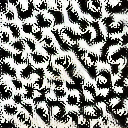

100%|██████████| 512/512 [00:20<00:00, 24.49it/s]



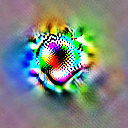

In [4]:
#high reconstruction sparse circuit




#orig
dissected_model = dissected_model.to(device).eval()

print('feature_6:83')
_ = render.render_vis(model, "features_6:301", show_inline=True)


obj  = objectives.neuron('features_6',83)
_ = render.render_vis(dissected_model,  obj, show_inline=True)

In [8]:
root = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner_cvpr2022/extracted_circuits/alexnet_sparse/imagenet_2/actxgrad/'
file = 'alexnet_sparse_features_6:83_0.01.pt'
data = torch.load(root+file)

In [9]:
sparse_model = data['pruned_model'].to(device).eval()
dissected_sparse_model = dissected_model = dissect_model(deepcopy(sparse_model), store_activations = False, store_ranks = False, device=device)

In [10]:

#sparse
dissected_sparse_model = dissected_sparse_model.to(device).eval()

print('feature_6:0')
_ = render.render_vis(sparse_model, "features_6:0", show_inline=True)


obj  = objectives.neuron('features_6',0)
_ = render.render_vis(dissected_sparse_model,  obj, show_inline=True)

  0%|          | 0/512 [00:00<?, ?it/s]

feature_6:0


AssertionError: There are no saved feature maps. Make sure to put the model in eval mode, like so: `model.to(device).eval()`. See README for example.

In [14]:
dissected_sparse_model.features_6

dissected_Conv2d(
  (preadd_conv): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=4, bias=False)
)

### cum salience versus sparsity

In [24]:
df_actgrad = df.loc[(df['method'] == 'actxgrad') & (df['model'] == 'alexnet_sparse')]

In [25]:
df_actgrad.columns

Index(['model', 'sparsity', 'unit', 'layer', 'cum_sal', 'masked_spearman',
       'masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff',
       'pruned_normed_diff', 'method', 'structure', 'batch_size', 'data_path',
       'config', 'feature_name', 'total_collapse', 'total_params', 'masked_k',
       'effective_k', 'effective_sparsity'],
      dtype='object')

In [26]:
round(pearsonr(df_actgrad['effective_sparsity'],df_actgrad['masked_pearson'])[0],4)

0.7295

In [27]:
xs = ['sparsity','effective_sparsity','cum_sal']
ys = ['masked_spearman',
       'masked_pearson', 'masked_avg_diff', 'masked_normed_diff',
       'pruned_spearman', 'pruned_pearson', 'pruned_avg_diff',
       'pruned_normed_diff']


comparisons = {}

for x in xs:
    for y in ys:
        try:
            p = round(pearsonr(df_actgrad[x].astype(float),df_actgrad[y])[0],4)
            comparisons[x+' : '+y] = p
        except:
            print(x)
            print(df_actgrad[x])
            print(y)
            print(df_actgrad[y])
            
            

comparisons_sorted = dict(sorted(comparisons.items(), key=lambda item: item[1]))


In [28]:
comparisons_sorted

{'effective_sparsity : pruned_normed_diff': -0.5478,
 'sparsity : pruned_normed_diff': -0.5442,
 'effective_sparsity : masked_normed_diff': -0.5433,
 'sparsity : masked_normed_diff': -0.5402,
 'effective_sparsity : pruned_avg_diff': -0.5253,
 'effective_sparsity : masked_avg_diff': -0.5252,
 'sparsity : masked_avg_diff': -0.5042,
 'sparsity : pruned_avg_diff': -0.5037,
 'cum_sal : masked_normed_diff': -0.4457,
 'cum_sal : pruned_normed_diff': -0.4444,
 'cum_sal : masked_avg_diff': -0.3431,
 'cum_sal : pruned_avg_diff': -0.3379,
 'effective_sparsity : masked_pearson': 0.7295,
 'effective_sparsity : pruned_pearson': 0.7305,
 'sparsity : masked_pearson': 0.734,
 'sparsity : pruned_pearson': 0.735,
 'effective_sparsity : masked_spearman': 0.7494,
 'effective_sparsity : pruned_spearman': 0.7506,
 'sparsity : masked_spearman': 0.7529,
 'sparsity : pruned_spearman': 0.7541,
 'cum_sal : pruned_pearson': 0.9497,
 'cum_sal : masked_pearson': 0.95,
 'cum_sal : pruned_spearman': 0.9541,
 'cum_sal 

In [38]:
x = list(df_actgrad['cum_sal'].astype(float))
y = list(df_actgrad['pruned_spearman'].astype(float))

In [39]:
#WARNING! if component edges this could take a long time
 
import plotly.figure_factory as ff
import numpy as np

# Add histogram data
hist_data = [list(df_actgrad['cum_sal'].astype(float)),list(df_actgrad['pruned_pearson'].astype(float))]

bin_size = np.std(hist_data[1])/10
    
# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, ['cumulative_salience','pearson'], bin_size=bin_size)
fig.show()

In [40]:
import plotly.graph_objects as go


fig = go.Figure()


fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers'))

    
fig.update_xaxes(title = 'cumulative salience')
fig.update_yaxes(title = 'pearson')
  
fig.show()

In [41]:
x = list(df_actgrad['sparsity'].astype(float))


fig = go.Figure()


fig.add_trace(go.Scatter(x=x, y=y,
                    mode='markers'))

    
fig.update_xaxes(title = 'sparsity')
fig.update_yaxes(title = 'pearson')
  
fig.show()